### Figures

In [1]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr as pearson
from scipy.stats import chi2_contingency as chis
from scipy.ndimage import gaussian_filter
from statsmodels.stats.multitest import fdrcorrection as fdr
import os
import matplotlib.pyplot as plt
import matplotlib.gridspec as gs
import re
from scipy.stats import mannwhitneyu as MannWhit
import seaborn as sns
from scipy import stats

%matplotlib inline  

In [2]:
# load dictionaries with nucleosome scores
data={
'D1':np.load('/Users/sgnan/Desktop/paramecium/tracks/D1_nucleosome_score.npy',allow_pickle='TRUE').item(),
'D2': np.load('/Users/sgnan/Desktop/paramecium/tracks/D2_nucleosome_score.npy',allow_pickle='TRUE').item(),
'S41': np.load('/Users/sgnan/Desktop/paramecium/tracks/S41_nucleosome_score.npy',allow_pickle='TRUE').item(),
'S32new': np.load('/Users/sgnan/Desktop/paramecium/tracks/S32new_nucleosome_score.npy',allow_pickle='TRUE').item()
}

In [3]:
#calculate average Naked DNA and Chromatine samples
data['D']={Scaffold:(data['D1'][Scaffold]+data['D2'][Scaffold])/2 for Scaffold in data['D1'].keys()}
data['S']={Scaffold:(data['S41'][Scaffold]+data['S32new'][Scaffold])/2 for Scaffold in data['S32new'].keys()}


In [4]:
#function to calculate heatmap matrix
def matrix_to_plot (data,regions,size=100):
    #convert regions
    regions=regions.assign(centre=round((regions.start+regions.end)/2,0))
    regions=regions.assign(start_region=regions.centre-size,
                            end_region=regions.centre+size)
    regions[['scaffold','start_region','end_region']]=regions[['scaffold','start_region','end_region']].astype(int)
    regions=regions.query('start_region > 0')
    
    # flip the arrya based on the gene/feature orientation 
    def select_orientation(Data,region):
        vect=Data[region.scaffold][region.start_region:region.end_region+1]
        if (region.strand=='-'):
            return(np.flip(vect,axis=0))
        else:
            return(vect)
    
    #calculate matrix
    data=[select_orientation(data,regions.iloc[i]) for i in range(regions.shape[0])]
    data=np.matrix([i for i in data if len(i) == (size*2+1)])
    
    #return matrix
    return(data)

In [5]:
#recover TSS and TTS info identified by Cap-seq and polyA
TSS=pd.read_csv('/Users/sgnan/Desktop/paramecium/Genes/ptetraurelia_mac_51_annotation_v2.0_5UTR_TSS.tab',sep='\t',skiprows=1,names=['scaffold','start','strand','Gene'])
TSS['scaffold']=TSS.scaffold.str.split('_').str[1]
TSS[['end']]=TSS[['start']]
TSS[['scaffold','start','end']]=TSS[['scaffold','start','end']].astype(int)

TTS=pd.read_csv('/Users/sgnan/Desktop/paramecium/Genes/ptetraurelia_mac_51_annotation_v2.0_3UTR_TTS.tab',sep='\t',skiprows=1,names=['scaffold','start','strand','Gene'])
TTS['scaffold']=TTS.scaffold.str.split('_').str[1]
TTS[['end']]=TTS[['start']]
TTS[['scaffold','start','end']]=TTS[['scaffold','start','end']].astype(int)


In [6]:
# select Scaffold <= 166 and 556
TSS=TSS.query('scaffold < 167 or scaffold==556')
TTS=TTS.query('scaffold < 167 or scaffold==556')

In [7]:
# Number of Cap-seq TSS
TSS.shape[0]

9657

In [8]:
# Number of polyA TTS
TTS.shape[0]

4463

In [9]:
# prepare regions for heatmaps 
TSS_for_heatmap=TSS.assign(start=TSS.start,end=TSS.end).filter(['scaffold','start','end','strand'])

TTS_for_heatmap=TTS.assign(start=TTS.start,end=TTS.end).filter(['scaffold','start','end','strand'])

In [10]:
#calculate matrixes for plotting TSS
TSS_signals={i:matrix_to_plot(data[i],TSS_for_heatmap,1000) for i in data.keys()}

#calculate matrixes for plotting TTS
TTS_signals={i:matrix_to_plot(data[i],TTS_for_heatmap,1000) for i in data.keys()}


In [11]:
# function to calculate avarage profiles
def average_profile(data):
    data=np.asarray(data.mean(axis=0)).ravel()
    return (data)

In [12]:
#Calculare averages TSS
TSS_signals_av={i:average_profile(TSS_signals[i]) for i in TSS_signals.keys()}

#Calculare averages TTS
TTS_signals_av={i:average_profile(TTS_signals[i]) for i in TTS_signals.keys()}


In [13]:
# Function to plot heatmaps, profiles and normalised profiles and save them
def plot_heatmaps_and_profiles (Signal,AV,what,HeatRatio=1,HeatTH=0.014,HeatColor='YlOrRd',baseline=0.015,minmaxAv=[0,0.034],breaks=[0,1000,2001],label=['-1kb','0','+1kb']):
    keys=[*Signal.keys()]
    how_many=len(keys)
    fig = plt.figure()
    spec = gs.GridSpec(ncols=how_many, nrows=1)

    for j in range(how_many):
        ax= fig.add_subplot(spec[j])
        ax.set_title(keys[j]+' - '+what)
        im= ax.imshow(Signal[keys[j]],aspect=HeatRatio,vmin=0, vmax=HeatTH,cmap=HeatColor)
        #heatmaps have been saturated in order to better see the signal
        plt.colorbar(im, ax=ax, ticks=[0,HeatTH], orientation='horizontal',fraction=0.01, pad=0.1, extend='max')
        plt.yticks([])
        plt.xticks(breaks, label,rotation=90)

    fig.set_size_inches(30, 15)
    plt.savefig('heatmap_nucleosomes_'+what+'.pdf',  format='pdf')
    
    fig = plt.figure()
    spec = gs.GridSpec(ncols=how_many, nrows=1)


    for j in range(how_many):        
        ax = fig.add_subplot(spec[j])
        ax.set_title(keys[j]+' - '+what)
        im=ax.plot(AV[keys[j]])
        plt.xticks(breaks, label)
        plt.yticks([minmaxAv[0],sum(minmaxAv)/2,minmaxAv[1]])

    fig.set_size_inches(30, 2.5)
    plt.savefig('profiles_nucleosomes_'+what+'.pdf',  format='pdf')
    
    #Normalised signal
    plt.figure(0)
    plt.title(what)
    plt.plot(AV['D'], label='Control')
    plt.plot(AV['S'], label='MMnase')
    plt.plot(baseline*(AV['S']/AV['D']), label='resised MMnase/Control')
    plt.legend()
    plt.xticks(breaks, label)
    plt.yticks([minmaxAv[0],sum(minmaxAv)/2,minmaxAv[1]])
    fig.set_size_inches(5, 5)
    plt.savefig('normalised_profiles_nucleosomes_'+what+'.pdf',  format='pdf')

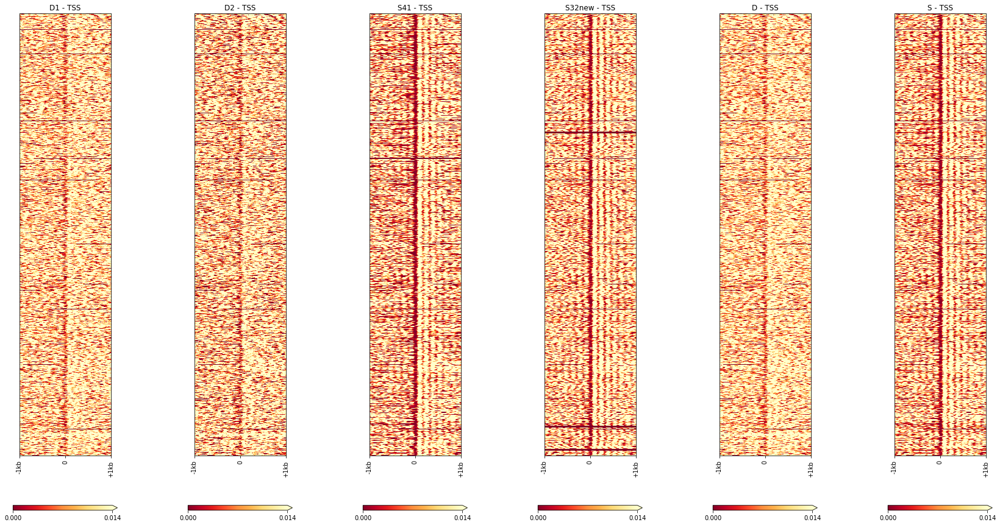

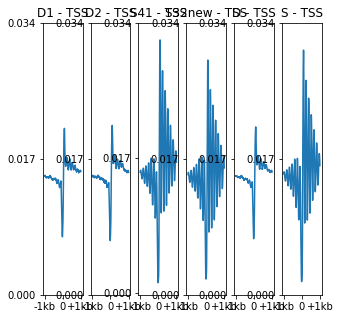

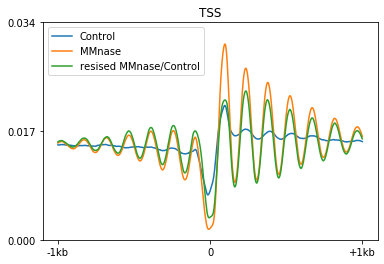

In [14]:
#Plot TSS heatmaps
plot_heatmaps_and_profiles(TSS_signals,TSS_signals_av,'TSS',
                           HeatColor='YlOrRd_r')

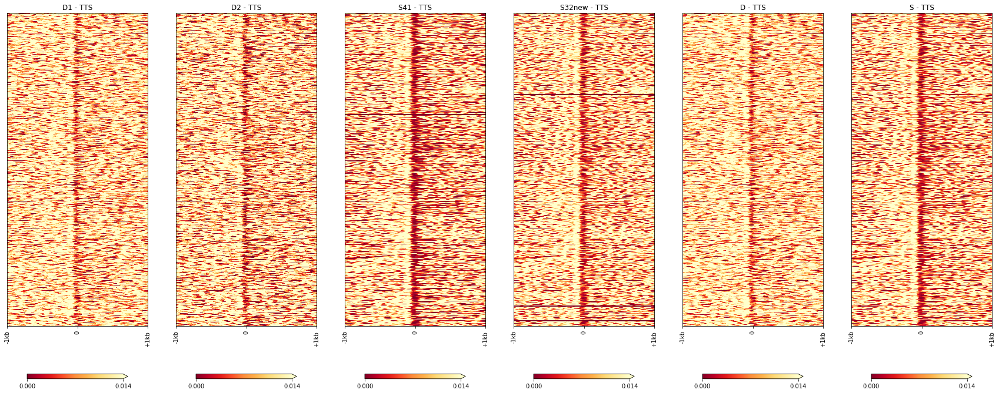

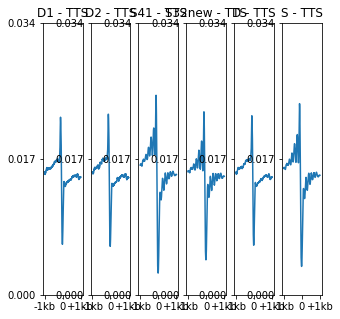

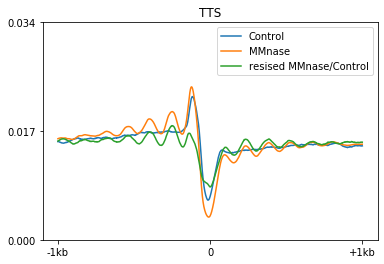

In [15]:
#Plot TTS heatmaps
plot_heatmaps_and_profiles(TTS_signals,TTS_signals_av,'TTS',
                           HeatColor='YlOrRd_r')

In [16]:
# Genes that have been confirmed by cap-seq and polyA det
Genes_to_keep_TTS_TSS=TSS[['scaffold','start', 'strand','Gene']].merge(TTS[['scaffold','end', 'strand','Gene']])
Genes_to_keep_TTS_TSS=Genes_to_keep_TTS_TSS.Gene

In [17]:
# Transcripts annotation  
Transcripts=pd.read_csv('/Users/sgnan/Desktop/paramecium/Genes/ptetraurelia_mac_51_annotation_v2.0.gff3',names=['scaffold','source','type','start','end','score', 'strand', 'phase','attributes'],sep='\t',skiprows=2)
Transcripts=Transcripts.query('type=="mRNA"').filter(['scaffold','start','end','strand','attributes'])
Transcripts['scaffold']=Transcripts.scaffold.str.split('_').str[1]
Transcripts[['scaffold','start','end']]=Transcripts[['scaffold','start','end']].astype(int)
Transcripts=Transcripts.query('(scaffold < 167 or scaffold==556) and start!=end ')
ID_gene=re.compile('PTET.{14}')
Transcripts['Gene']=Transcripts.attributes.apply(lambda x: ID_gene.findall(x)[2] )
Transcripts_ordered=(Transcripts
 .assign(len=Transcripts.end-Transcripts.start)
 .sort_values(['len'])
 .reset_index(drop=True)
 .drop(['len'],axis=1))

In [18]:
# keep transcripts confirmed by cap-seq and polyA
Transcripts_confirmed_TTS_TSS=Transcripts.query('Gene in @Genes_to_keep_TTS_TSS')

In [19]:
# Transcript that have been confirmed by cap-seq and polyA
Transcripts_confirmed_TTS_TSS.shape[0]

2895

In [20]:
# N of transcripts
Transcripts.shape[0]

38143

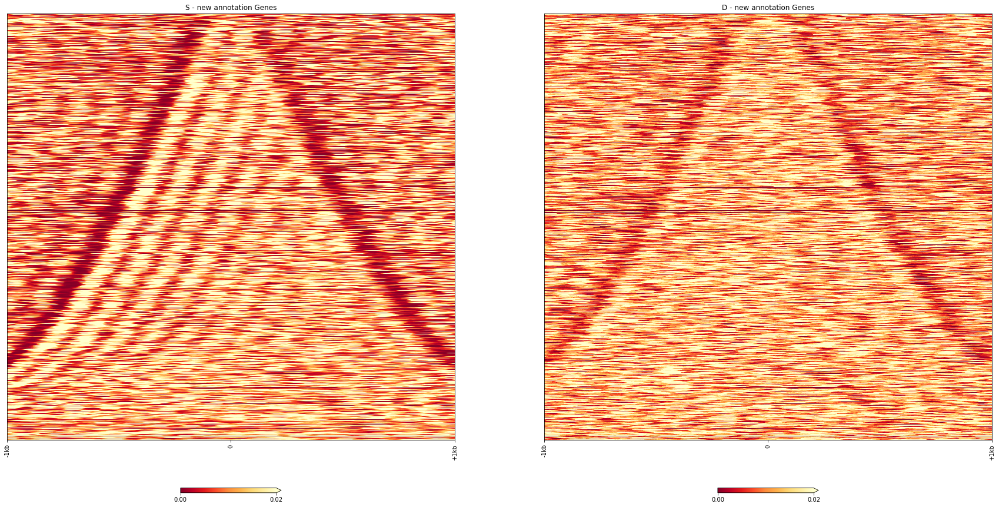

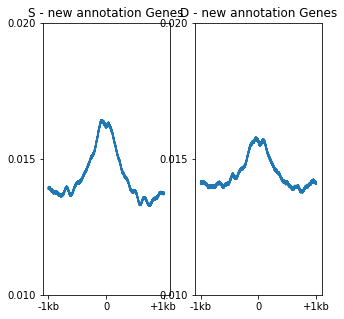

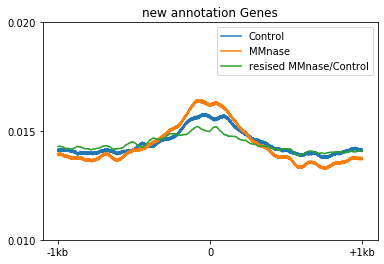

In [21]:
# Calculate signal 1kb around the center of each gene
Transcripts_ordered_signal={i:matrix_to_plot(data[i],Transcripts_ordered,1000) for i in ['S','D']}
# calculate average signal
Transcripts_ordered_signal_av={i:average_profile(Transcripts_ordered_signal[i]) for i in ['S','D']}


plot_heatmaps_and_profiles(Signal=Transcripts_ordered_signal,
                           AV=Transcripts_ordered_signal_av,
                           what='new annotation Genes',
                           HeatRatio=0.05,HeatTH=0.02,
                           HeatColor='YlOrRd_r',
                           minmaxAv=[0.01,0.02],baseline=0.0145)

In [22]:
Transcripts=Transcripts.sort_values(['scaffold','start']).reset_index(drop=True)
Transcripts['direction']=Transcripts['strand'].apply(lambda x: -1 if x=='-' else 1)

In [23]:
convergent=pd.DataFrame()
divergent=pd.DataFrame()
tandem=pd.DataFrame()
for Scaffold in list(range(1,167))+[556]:
    # calculate centers between two genes
    center_intergene=(np.matrix(Transcripts.query('scaffold==@Scaffold').end).T+np.matrix(Transcripts.query('scaffold==@Scaffold').start))/2
    centers=center_intergene.diagonal(1).round()
    # calculate distance between two genes
    distance_intergene=abs(np.matrix(Transcripts.query('scaffold==@Scaffold').end).T-np.matrix(Transcripts.query('scaffold==@Scaffold').start)).diagonal(1)
    sign=(np.matrix(Transcripts.query('scaffold==@Scaffold').direction).T-np.matrix(Transcripts.query('scaffold==@Scaffold').direction)).diagonal(1)
    
    convergent=convergent.append(pd.
                                 DataFrame({'scaffold':[str(Scaffold) for i in range(np.sum(sign==2))],
                                               'center':np.round(np.array(centers[sign==2]).flatten()),
                                               'distance':np.round(np.array(distance_intergene[sign==2]).flatten()),
                                              'strand':Transcripts.query('scaffold==@Scaffold').iloc[np.where(np.array(sign==2).flatten())].strand}))
    divergent=divergent.append(pd.DataFrame({'scaffold':[str(Scaffold) for i in range(np.sum(sign==-2))],
                                             'center':np.round(np.array(centers[sign==-2]).flatten()),
                                             'distance':np.round(np.array(distance_intergene[sign==-2]).flatten()),
                                              'strand':Transcripts.query('scaffold==@Scaffold').iloc[np.where(np.array(sign==-2).flatten())].strand}))
    tandem=tandem.append(pd.DataFrame({'scaffold':[str(Scaffold) for i in range(np.sum(sign==0))],
                                       'center':np.round(np.array(centers[sign==0]).flatten()),
                                       'distance':np.round(np.array(distance_intergene[sign==0]).flatten()),
                                              'strand':Transcripts.query('scaffold==@Scaffold').iloc[np.where(np.array(sign==0).flatten())].strand}))
    

In [24]:
# sort by distance between two genes
convergent=convergent.sort_values(['distance'])
divergent=divergent.sort_values(['distance'])
tandem=tandem.sort_values(['distance'])

In [25]:
# calculate matrixes for plotting (converging genes)
convergent_for_heat=convergent.assign(start=convergent.center,end=convergent.center,strand=['+' for i in range(len(convergent.center))]).filter(['scaffold','start','end','strand'])
convergent_for_heat_signals={i:matrix_to_plot(data[i],convergent_for_heat,1000) for i in data.keys()}
convergent_for_heat_signals_av={i:average_profile(convergent_for_heat_signals[i]) for i in convergent_for_heat_signals.keys()}


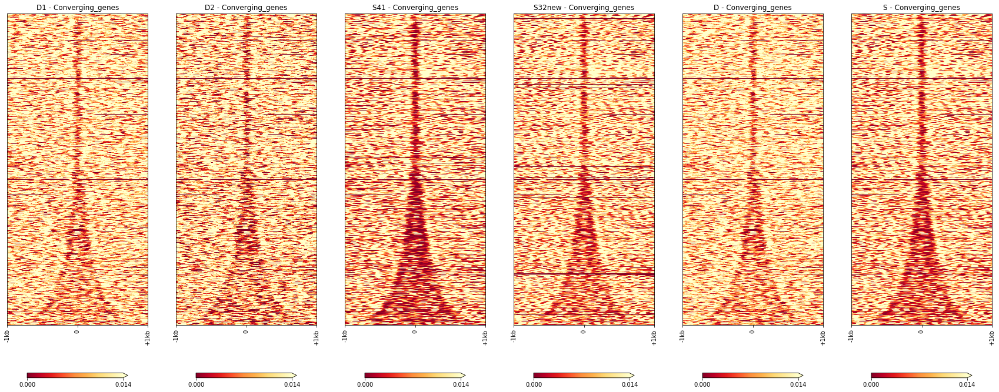

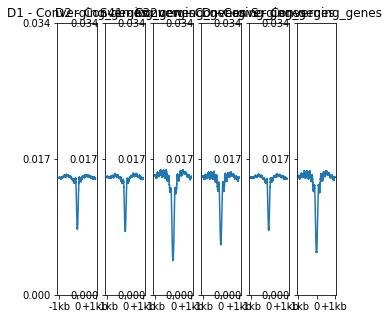

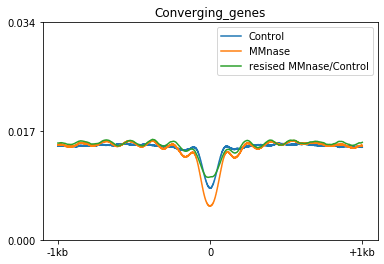

In [26]:
# Plot heatmaps converging genes
plot_heatmaps_and_profiles(convergent_for_heat_signals,convergent_for_heat_signals_av,'Converging_genes',
                           HeatRatio=0.5,
                           HeatColor='YlOrRd_r')

In [27]:
# calculate matrixes for plotting (diverging genes)

divergent_for_heat=divergent.assign(start=divergent.center,end=divergent.center,strand=['+' for i in range(len(divergent.center))]).filter(['scaffold','start','end','strand'])
divergent_for_heat_signals={i:matrix_to_plot(data[i],divergent_for_heat,1000) for i in data.keys()}
divergent_for_heat_signals_av={i:average_profile(divergent_for_heat_signals[i]) for i in divergent_for_heat_signals.keys()}


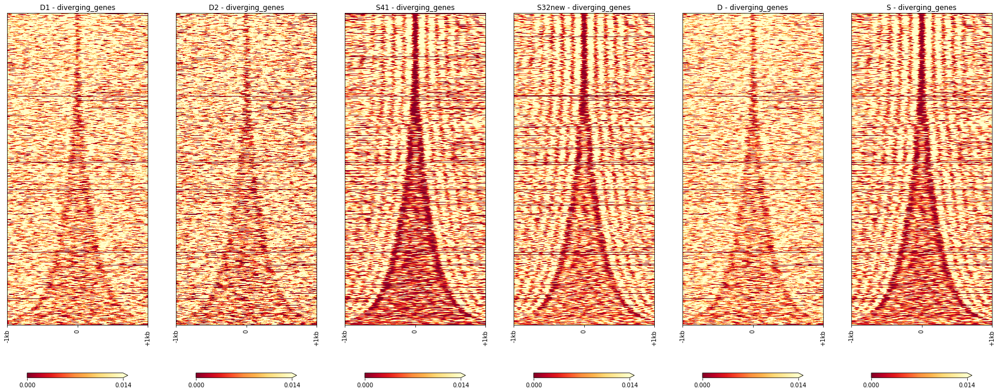

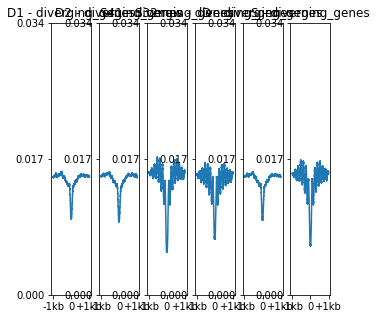

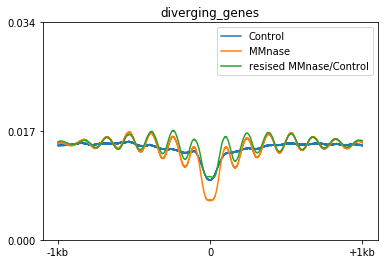

In [28]:
# Plot heatmaps diverging genes

plot_heatmaps_and_profiles(divergent_for_heat_signals,divergent_for_heat_signals_av,'diverging_genes',
                           HeatRatio=0.5,
                           HeatColor='YlOrRd_r')

In [29]:
# calculate matrixes for plotting (tandem genes)

tandem_for_heat=tandem.assign(start=tandem.center,end=tandem.center,strand=['+' for i in range(len(tandem.center))]).filter(['scaffold','start','end','strand'])
tandem_for_heat_signals={i:matrix_to_plot(data[i],tandem_for_heat,1000) for i in data.keys()}
tandem_for_heat_signals_av={i:average_profile(tandem_for_heat_signals[i]) for i in tandem_for_heat_signals.keys()}


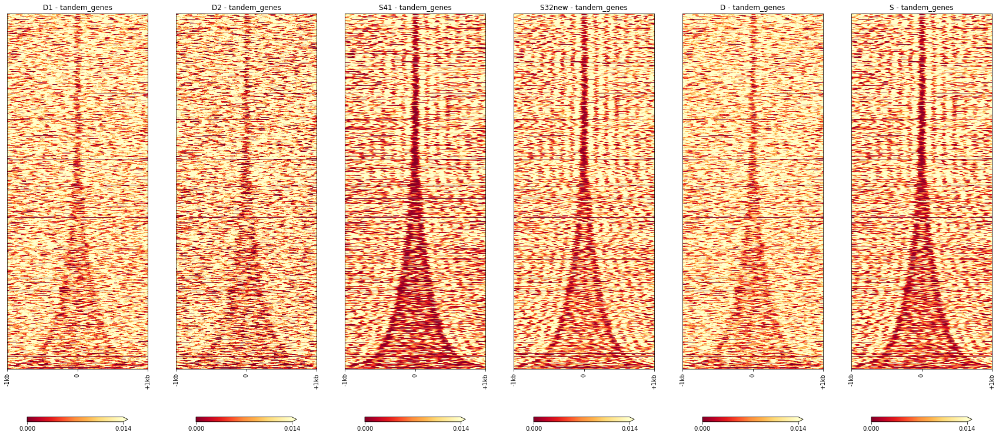

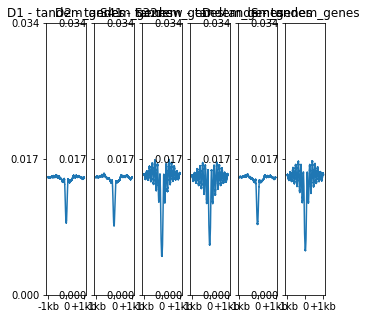

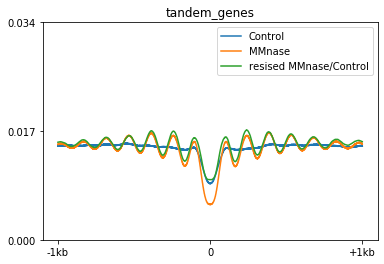

In [30]:
# Plot heatmaps tandem genes

plot_heatmaps_and_profiles(tandem_for_heat_signals,tandem_for_heat_signals_av,'tandem_genes',
                                                      HeatRatio=0.25,
                           HeatColor='YlOrRd_r')

In [31]:
#Number of converging pairs 
convergent.shape[0]

8876

In [32]:
#Number of diverging pairs 
divergent.shape[0]

8867

In [33]:
#Number of tandem pairs 
tandem.shape[0]

20233

In [34]:
#load common peaks
Peaks=pd.read_csv("/Users/sgnan/Desktop/paramecium/common_Nucleosome_peaks.bed",sep='\t',names=['scaffold','start','end'])

# calculate peak center
Peaks=Peaks.assign(center=(Peaks.start+Peaks.end)/2)


In [35]:
# recover exons info
exons=pd.read_csv('/Users/sgnan/Desktop/paramecium/Genes/ptetraurelia_mac_51_annotation_v2.0.gff3',names=['scaffold','source','type','start','end','score', 'strand', 'phase','attributes'],sep='\t',skiprows=2)
exons=exons.query('type=="exon"').filter(['scaffold','start','end','strand','attributes'])
exons['scaffold']=exons.scaffold.str.split('_').str[1]
exons[['scaffold','start','end']]=exons[['scaffold','start','end']].astype(int)
exons=exons.query('(scaffold < 167 or scaffold==556) and start!=end')
# fetch genes ID
ID_gene=re.compile('PTET.{14}')
exons['Gene']=exons.attributes.apply(lambda x: ID_gene.findall(x)[2] )
exons=exons.assign(
Size=abs(exons.start-exons.end)+1)

#CDS
CDS=exons.filter(['Gene','Size']).groupby('Gene').agg({'Size':['sum','count']})
CDS.columns=['CDS_size','nexons']
CDS=CDS.reset_index().query('nexons >= 3')

#gene to keep
genes_to_keep=CDS.Gene

exons=exons.query('Gene in @genes_to_keep')


In [36]:
# randomise sizes of exons and introns
def shuffle_sizes(x):
    RNA_Size=int(x['CDS_size'])
    exons=int(x['nexons'])
    y=x['Gene']
    random=RNA_Size//exons
    y=pd.DataFrame({'Gene':y,
    'random':random})
    return y

In [37]:
# simulate constant size exons
random=pd.concat([shuffle_sizes(CDS.iloc[[i]]) for i in range(CDS.shape[0])])
exons=exons.merge(random)

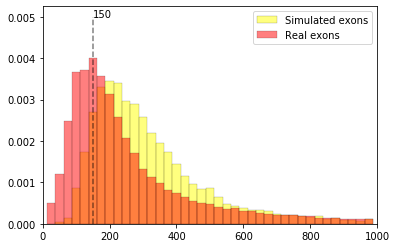

In [38]:
# plot exons sizes 
plt.hist(exons.random,bins=np.array(range(0,1000,25))+12.5,color='yellow',alpha=0.5, edgecolor='black', linewidth=0.3,label='Simulated exons',density=True)
plt.hist(exons.Size,bins=np.array(range(0,1000,25))+12.5,color='red',alpha=0.5, linewidth=0.3, edgecolor='black',label='Real exons',density=True)
plt.vlines(150,0,0.005,linestyles='dashed',alpha=0.5)
plt.text(150,0.005,'150')
plt.xlim(0,1000)
plt.legend()
plt.savefig('Exons.pdf',  format='pdf')


In [39]:
# modify gene name to match the transcript one
Genes_to_keep_TTS_TSS=Genes_to_keep_TTS_TSS.apply(lambda x: x.replace('G','T'))

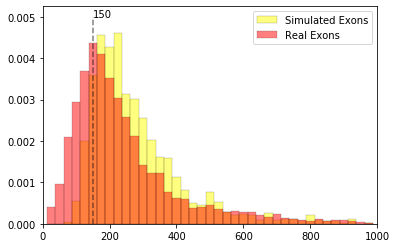

In [40]:
# plot exons size distribution of only transcripts id with cap-seq and polyA det
plt.hist(exons.query('Gene in @Genes_to_keep_TTS_TSS').random,bins=np.array(range(0,1000,25))+12.5,color='yellow',alpha=0.5, edgecolor='black', linewidth=0.3,label='Simulated Exons',density=True)
plt.hist(exons.query('Gene in @Genes_to_keep_TTS_TSS').Size,bins=np.array(range(0,1000,25))+12.5,color='red',alpha=0.5, linewidth=0.3, edgecolor='black',label='Real Exons',density=True)
plt.vlines(150,0,0.005,linestyles='dashed',alpha=0.5)
plt.text(150,0.005,'150')
plt.xlim(0,1000)
plt.legend()
plt.savefig('Exons_TSS_TTS_Confirmed.pdf',  format='pdf')

In [41]:
# percentage of exons with size between 100 and 200 bp
100*len(exons.query('Size > 100 and Size <200 ').Size)/len(exons.Size)

34.8043893129771

In [42]:
# percentage of simulated exons with size between 100 and 200 bp
100*len(exons.query('random > 100 and random <200 ').random)/len(exons.random)

24.120229007633586

In [43]:
# are exons smaller than simulated exons?
MannWhit(exons.Size,exons.random, alternative='less')

MannwhitneyuResult(statistic=4071676132.5, pvalue=0.0)

In [44]:
# percentage of exons with size between 100 and 200 bp (Cap-seq/polA only)
100*len(exons.query('Size > 100 and Size <200 and Gene in @Genes_to_keep_TTS_TSS ').Size)/len(exons.query('Gene in @Genes_to_keep_TTS_TSS').Size)

37.48635205629019

In [45]:
# percentage of simulated exons with size between 100 and 200 bp (Cap-seq/polA only)
100*len(exons.query('random > 100 and random <200 and Gene in @Genes_to_keep_TTS_TSS ').random)/len(exons.query('Gene in @Genes_to_keep_TTS_TSS').random)

31.335678757733834

In [46]:
# are exons smaller than simulated exons? (Cap-seq/polA only)
MannWhit(exons.query('Gene in @Genes_to_keep_TTS_TSS').Size,exons.query('Gene in @Genes_to_keep_TTS_TSS').random, alternative='less')

MannwhitneyuResult(statistic=26720692.5, pvalue=7.307429582289297e-125)

In [47]:
#load full introns df
all_introns=pd.read_csv('/Volumes/Storage3/Paramecium.FromChunlong/Data/NMD/20140122.Intron.Count.WTandNMD.Mac51.Validated.tab',sep='\t').query('(Scaffold <= 166 or Scaffold==556 ) and WT_Spl > WT_Ret+WT_AS')

all_introns=(all_introns
.rename(columns={'Scaffold':'scaffold','Intron_start_Mac51':'start','Intron_stop_Mac51':'end','Sense':'strand'}))

all_introns['strand']=all_introns.strand.apply(lambda x: '-' if x== -1 else '+')
#intron sizes
all_introns['Size']=all_introns['end']-all_introns['start']+1

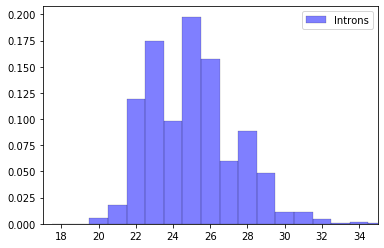

In [48]:
#plot introns sizes distribution
plt.hist(all_introns.Size,bins=np.array(range(17,36))+0.5,color='blue',alpha=0.5, linewidth=0.3, edgecolor='black',label='Introns',density=True)

plt.xlim(17,35)

plt.legend()
plt.savefig('Introns_the_frequncedone.pdf',  format='pdf')


In [49]:
#calculate centers
all_introns=all_introns.assign(center=(all_introns.start+all_introns.end)/2,distance_center=np.nan)
exons=exons.assign(center=(exons.start+exons.end)/2,distance_center=np.nan)


In [50]:
# calculate distance between intron/exon center and closest nucleosome center 
Scaffold_list=np.unique(Peaks.scaffold.values)
for Scaffold in Scaffold_list:
    
    exons[exons.scaffold==Scaffold]=exons[exons.scaffold==Scaffold].assign(
        distance_center=np.asarray(np.min(abs(np.matrix(exons.query('scaffold=='+str(Scaffold)).center.values)-np.matrix(Peaks.query('scaffold=='+str(Scaffold)).center.values).T),axis=0))[0],
    )
    all_introns[all_introns.scaffold==Scaffold]=all_introns[all_introns.scaffold==Scaffold].assign(
        distance_center=np.asarray(np.min(abs(np.matrix(all_introns.query('scaffold=='+str(Scaffold)).center.values)-np.matrix(Peaks.query('scaffold=='+str(Scaffold)).center.values).T),axis=0))[0],
    )
    
 

In [51]:
# assign category based on distance from closest nucleosome
def position_intron(x,col):
    if x[col] <= 25:
        return('1-Central')
    elif x[col] >= 50 and x[col] <= 75 :
        return ('3-Distal')
    elif x[col] > 25 and x[col] < 50 :
        return ('2-Proximal')
    else:
        return('4-Unclassified')
    
all_introns=all_introns.assign(Position=all_introns.apply(lambda x: position_intron(x,col='distance_center'),axis=1))

exons=exons.query('Size <300').assign(Position=exons.apply(lambda x: position_intron(x,col='distance_center'),axis=1))



In [52]:
# number of analys introns 
all_introns.shape[0]

71022

In [53]:
# number of analyse exons
exons.shape[0]

72203

In [54]:
#calculate proportions
#introns
Cintrons=all_introns.groupby(['Position']).size()
#exons

Cexons=exons.groupby(['Position']).size()

#total
Ctotal=Cintrons+Cexons

In [55]:
#introns
Xintrons=Cintrons/np.sum(Cintrons.values)
Xfix_introns=all_introns.query('Position != "4-Unclassified"').groupby(['Position']).size()

#exons
Xexons=Cexons/np.sum(Cexons.values)
Xfix_exons=exons.query('Position != "4-Unclassified"').groupby(['Position']).size()

#fix total
Xfix_total=Xfix_exons+Xfix_introns

#ration
Xfix_introns=Xfix_introns/np.sum(Xfix_introns)

Xfix_exons=Xfix_exons/np.sum(Xfix_exons)
Xfix_total=Xfix_total/np.sum(Xfix_total)

#total
Xtotal=Ctotal/np.sum(Ctotal.values)
Xfix_total=Xfix_total/np.sum(Xfix_total)

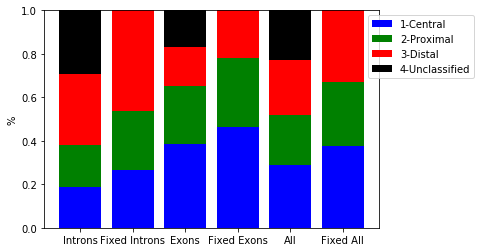

In [56]:
p1=plt.bar(x=['Introns','Fixed Introns','Exons','Fixed Exons','All','Fixed All'],
           height=[Xintrons.values[0],Xfix_introns.values[0],Xexons.values[0],Xfix_exons.values[0],Xtotal.values[0],Xfix_total.values[0]],
           color=['blue'])
p2=plt.bar(x=['Introns','Fixed Introns','Exons','Fixed Exons','All','Fixed All'],
           height=[Xintrons.values[1],Xfix_introns.values[1],Xexons.values[1],Xfix_exons.values[1],Xtotal.values[1],Xfix_total.values[1]],
           bottom=[Xintrons.values[0],Xfix_introns.values[0],Xexons.values[0],Xfix_exons.values[0],Xtotal.values[0],Xfix_total.values[0]],
           color=['green'])
p3=plt.bar(x=['Introns','Fixed Introns','Exons','Fixed Exons','All','Fixed All'],
           height=[Xintrons.values[2],Xfix_introns.values[2],Xexons.values[2],Xfix_exons.values[2],Xtotal.values[2],Xfix_total.values[2]],
           bottom=[np.sum(Xintrons.values[range(2)]),np.sum(Xfix_introns.values[range(2)]),np.sum(Xexons.values[range(2)]),np.sum(Xfix_exons.values[range(2)]),np.sum(Xtotal.values[range(2)]),np.sum(Xfix_total.values[range(2)])],
           color=['red'])
p4=plt.bar(x=['Introns','Fixed Introns','Exons','Fixed Exons','All','Fixed All'],
           height=[Xintrons.values[3],0,Xexons.values[3],0,Xtotal.values[3],0],
           bottom=[np.sum(Xintrons.values[range(3)]),0,np.sum(Xexons.values[range(3)]),0,np.sum(Xtotal.values[range(3)]),0],color=['black'])

plt.legend((p1[0], p2[0],p3[0],p4[0]), (Xintrons.index[[0,1,2,3]]), bbox_to_anchor=(1.3, 1))
plt.ylim([0,1])
plt.ylabel("%")

plt.savefig('Distribution_exons_intros_Nucleosomes.pdf',  format='pdf')


In [57]:
#chi square test between distributions (only classified)
chis(np.array([Cintrons[:3].values,Cexons[:3].values]))

(8028.888107593101,
 0.0,
 2,
 array([[18886.18137543, 14840.08612527, 16595.7324993 ],
        [22572.81862457, 17736.91387473, 19835.2675007 ]]))

In [58]:
#chi square test between distributions
chis(np.array([Cintrons[:].values,Cexons[:].values]))

(11109.780280382518,
 0.0,
 3,
 array([[20558.56936987, 16154.18882178, 18065.29922849, 16243.94257986],
        [20900.43063013, 16422.81117822, 18365.70077151, 16514.05742014]]))

In [59]:
x_Distal=all_introns.query('Position == "3-Distal" ').rename(columns={"Gene_ID":"Distal"}).filter(['X3n_class','PTC_inducing','Distal']).groupby(['X3n_class','PTC_inducing']).count().reset_index()
x_Central=all_introns.query('Position == "1-Central" ').rename(columns={"Gene_ID":"Central"}).filter(['X3n_class','PTC_inducing','Central']).groupby(['X3n_class','PTC_inducing']).count().reset_index()
x_Proximal=all_introns.query('Position == "2-Proximal" ').rename(columns={"Gene_ID":"Proximal"}).filter(['X3n_class','PTC_inducing','Proximal']).groupby(['X3n_class','PTC_inducing']).count().reset_index()

xIntrons= pd.merge(x_Distal, x_Central,how='inner',on=['X3n_class','PTC_inducing'])
xIntrons= pd.merge(xIntrons, x_Proximal,how='inner',on=['X3n_class','PTC_inducing'])
cIntrons=xIntrons.copy()

xIntrons['total']=np.sum(xIntrons[['Distal','Central','Proximal']],axis=1)
xIntrons[['Distal','Central','Proximal']]=xIntrons.apply(lambda x: x[['Distal','Central','Proximal']]/x['total'],axis=1)
xIntrons=xIntrons.sort_values(['PTC_inducing'])

In [60]:
cIntrons

,X3n_class,PTC_inducing,Distal,Central,Proximal
0,3n,invisible,3402,1557,1686
1,3n,visible,1155,833,818
2,non3n,invisible,1305,624,709
3,non3n,visible,17438,10461,10334


In [61]:
# give starts for significance
def stars(x):
    if x >= 0.05:
        return 'NS'
    elif x < 0.05 and x >= 10**-2:
        return '*'
    elif x < 10**-2and x >= 10**-3:
        return '**'
    elif x < 10**-3and x >= 10**-4:
        return '***'
    elif x < 10**-4 and x >= 10**-5:
        return '****'
    elif x < 10**-5 and x >= 10**-6:
        return '*****'
    elif x < 10**-6:
        return '******'

In [62]:
# test distributions using chi squared
tests={'Visible 3n vs non 3n':chis(np.array(cIntrons.query('PTC_inducing=="visible"')[['Distal','Central','Proximal',]])),
 'invisible 3n vs non 3n':chis(np.array(cIntrons.query('PTC_inducing=="invisible"')[['Distal','Central','Proximal',]])),
 '3n visible vs invisible':chis(np.array(cIntrons.query('X3n_class=="3n"')[['Distal','Central','Proximal',]])),
 'non 3n visible vs invisible':chis(np.array(cIntrons.query('X3n_class=="non3n"')[['Distal','Central','Proximal',]])),
 '3n visible vs non 3n invisible':chis(np.array(cIntrons.query('(X3n_class=="3n" and PTC_inducing=="visible") or (X3n_class=="non3n" and PTC_inducing=="invisible")')[['Distal','Central','Proximal',]])),
 'non 3n visible vs 3n invisible':chis(np.array(cIntrons.query('(X3n_class=="non3n" and PTC_inducing=="visible") or  (X3n_class=="3n" and PTC_inducing=="invisible")')[['Distal','Central','Proximal',]]))
}

# adjust pval with fdr
adjusted_pval=fdr([tests[i][1] for i in tests.keys()])
keys=[i for i in tests.keys()]
{keys[i]:[adjusted_pval[1][i],stars(adjusted_pval[1][i])] for i in range(len(adjusted_pval[0])) }


{'Visible 3n vs non 3n': [4.1602708700022616e-05, '****'],
 'invisible 3n vs non 3n': [0.2458088122115666, 'NS'],
 '3n visible vs invisible': [7.821429297837281e-18, '******'],
 'non 3n visible vs invisible': [4.1602708700022616e-05, '****'],
 '3n visible vs non 3n invisible': [1.707811112479492e-09, '******'],
 'non 3n visible vs 3n invisible': [7.340214313160109e-17, '******']}

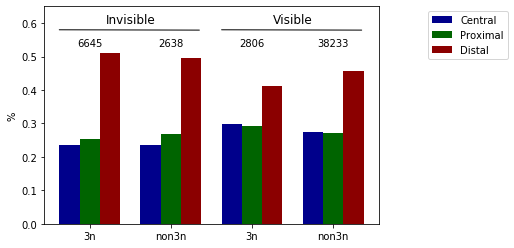

In [63]:
# bar plot for main figure 
plt.bar(x=np.array(range(0,4))-0.25,
        height=xIntrons.Central.values,width=0.25,color=['darkblue'],tick_label=xIntrons.X3n_class.values,label='Central'
       )
plt.bar(x=np.array(range(0,4)),width=0.25,
        height=xIntrons.Proximal.values,color=['darkgreen'],label='Proximal'
       )
plt.bar(x=np.array(range(0,4))+0.25,width=0.25,
        height=xIntrons.Distal.values,color=['darkred'],label='Distal'
       )

plt.xticks(range(0,4),xIntrons.X3n_class.values)

for i in range(4):
    plt.text(i,0.53,xIntrons.total.values.astype(str)[i],horizontalalignment='center')
    

plt.annotate(s='Invisible',xy=(0.5,0.6), xycoords='data',fontsize=12.0,textcoords='data',ha='center')
plt.annotate(s='Visible',xy=(2.5,0.6), xycoords='data',fontsize=12.0,textcoords='data',ha='center')
plt.annotate(s=' ',xy=(-0.4, 0.58), xycoords='data',
             xytext=(1.4, 0.57),textcoords='data',arrowprops=dict(arrowstyle="-"))
plt.annotate(s=' ',xy=(1.6, 0.58), xycoords='data',
             xytext=(3.4, 0.57),textcoords='data',arrowprops=dict(arrowstyle="-"))
plt.ylim(0,0.65)
plt.legend(loc='upper right', bbox_to_anchor=(1.4, 1))
plt.ylabel("%")

plt.savefig('Distribution_visible_invisible.pdf',  format='pdf')

In [64]:
# % 
xIntrons.Distal.values

array([0.51196388, 0.49469295, 0.41161796, 0.45609814])

In [65]:
xIntrons.Central.values

array([0.23431151, 0.23654284, 0.29686386, 0.2736118 ])

In [66]:
#calculate retention efficency
all_introns=all_introns.assign(Ret_eff_WT=100*all_introns.WT_Ret/(all_introns.WT_Ret+all_introns.WT_Spl+all_introns.WT_AS),
                                Ret_eff_NMD=100*all_introns.NMD_Ret/(all_introns.NMD_Ret+all_introns.NMD_Spl+all_introns.NMD_AS)
              )


In [67]:
# transfor RPKM in log RPKM and filter between -1 and 6
x=all_introns.assign(RPKM_WT=np.round(np.log(all_introns.RPKM_WT))).query('RPKM_WT <= 6 and RPKM_WT >= -1').rename(columns={'Ret_eff_WT':'WT','Ret_eff_NMD':'NMD'}).groupby(["PTC_inducing","Position","RPKM_WT"]).agg({'WT':['mean','sem'],
                                                                                                            'NMD':['mean','sem']}).reset_index()


In [68]:
# % increment of Retention C/D for the lowest group
D=np.array(x[np.logical_and(np.logical_and(x['RPKM_WT']==-1, x['PTC_inducing']=='visible'), x['Position'] =='3-Distal')]['NMD'][['mean']].values)
C=np.array(x[np.logical_and(np.logical_and(x['RPKM_WT']==-1, x['PTC_inducing']=='visible'), x['Position'] =='1-Central')]['NMD'][['mean']].values)
100*((C/D)-1)

array([[55.79875174]])

In [69]:
# % increment of Retention C/D for the RPKM=4 group
D=np.array(x[np.logical_and(np.logical_and(x['RPKM_WT']==4, x['PTC_inducing']=='visible'), x['Position'] =='3-Distal')]['NMD'][['mean']].values)
C=np.array(x[np.logical_and(np.logical_and(x['RPKM_WT']==4, x['PTC_inducing']=='visible'), x['Position'] =='1-Central')]['NMD'][['mean']].values)
100*((C/D)-1)

array([[38.89922573]])

In [70]:
# % increment of Retention C/D for the RPKM=5 group
D=np.array(x[np.logical_and(np.logical_and(x['RPKM_WT']==5, x['PTC_inducing']=='visible'), x['Position'] =='3-Distal')]['NMD'][['mean']].values)
C=np.array(x[np.logical_and(np.logical_and(x['RPKM_WT']==5, x['PTC_inducing']=='visible'), x['Position'] =='1-Central')]['NMD'][['mean']].values)
100*((C/D)-1)

array([[13.56842443]])

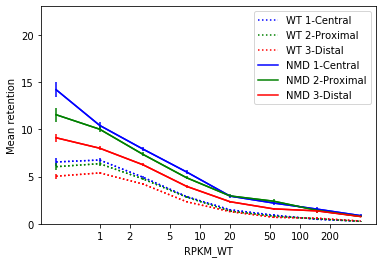

In [71]:
colors={'1-Central':'blue','3-Distal':'red','2-Proximal':'green'}
lines={'WT':'dotted','NMD':'solid'}
p=[]
labes=[]
for Line in ['WT','NMD']:
    for pos in ['1-Central','2-Proximal','3-Distal']:
        sub=x[np.logical_and(x.PTC_inducing.values == 'visible' , x.Position.values == pos)]
        plt.plot(sub.RPKM_WT.values,sub[Line]['mean'].values,
                          linestyle=lines[Line],
                          color=colors[pos],label=Line+' '+pos)

        plt.errorbar(sub.RPKM_WT.values,sub[Line]['mean'].values,sub[Line]['sem'].values,
                          linestyle=lines[Line],
                          color=colors[pos])
        
plt.legend()
ranges=np.array([1,2,5,10,20,50,100,200])
plt.xticks(np.log(ranges),ranges)
plt.xlabel("RPKM_WT")
plt.ylabel("Mean retention")
plt.ylim(0,23)

plt.savefig('Expression_Vs_retentin_Visible.pdf',  format='pdf')


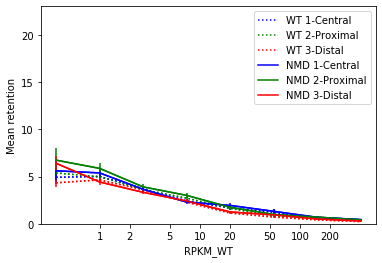

In [72]:
colors={'1-Central':'blue','3-Distal':'red','2-Proximal':'green'}
lines={'WT':'dotted','NMD':'solid'}
p=[]
labes=[]
for Line in ['WT','NMD']:
    for pos in ['1-Central','2-Proximal','3-Distal']:
        sub=x[np.logical_and(x.PTC_inducing.values == 'invisible' , x.Position.values == pos)]
        plt.plot(sub.RPKM_WT.values,sub[Line]['mean'].values,
                          linestyle=lines[Line],
                          color=colors[pos],label=Line+' '+pos)

        plt.errorbar(sub.RPKM_WT.values,sub[Line]['mean'].values,sub[Line]['sem'].values,
                          linestyle=lines[Line],
                          color=colors[pos])
        
plt.legend()
ranges=np.array([1,2,5,10,20,50,100,200])
plt.xticks(np.log(ranges),ranges)
plt.xlabel("RPKM_WT")
plt.ylabel("Mean retention")
plt.ylim(0,23)
plt.savefig('Expression_Vs_retentin_Inisible.pdf',  format='pdf')


In [73]:
# calculate pvalues MannWhit
x=all_introns.assign(RPKM_WT=np.round(np.log(all_introns.RPKM_WT))).query('RPKM_WT <= 6 and RPKM_WT >= -1').rename(columns={'Ret_eff_WT':'WT','Ret_eff_NMD':'NMD'})


Stat=dict()
h=0
position=['1-Central','2-Proximal','3-Distal']
for PTC in ['visible','invisible']:
    for Gen in ['WT','NMD']:
        for RPKM in np.unique(x.RPKM_WT):
            for P1 in range(2):
                for P2 in range(P1+1,3):
                    h+=1
                    Stat[h]={
                        'Compare':position[P1]+'_vs_'+position[P2],
                        'RPKM':RPKM,
                        'PTC':PTC,
                        'Gen':Gen,
                        'pval':MannWhit(x[np.logical_and(np.logical_and(x['PTC_inducing']==PTC, x['Position']==position[P1]),x['RPKM_WT']==RPKM)][Gen].values,
x[np.logical_and(np.logical_and(x['PTC_inducing']==PTC, x['Position']==position[P2]),x['RPKM_WT']==RPKM)][Gen].values)[1]}

In [74]:
#adjust with False discovery rate
x=pd.DataFrame(Stat).transpose()
x=x.assign(
pval_adj=fdr(x.pval)[1])

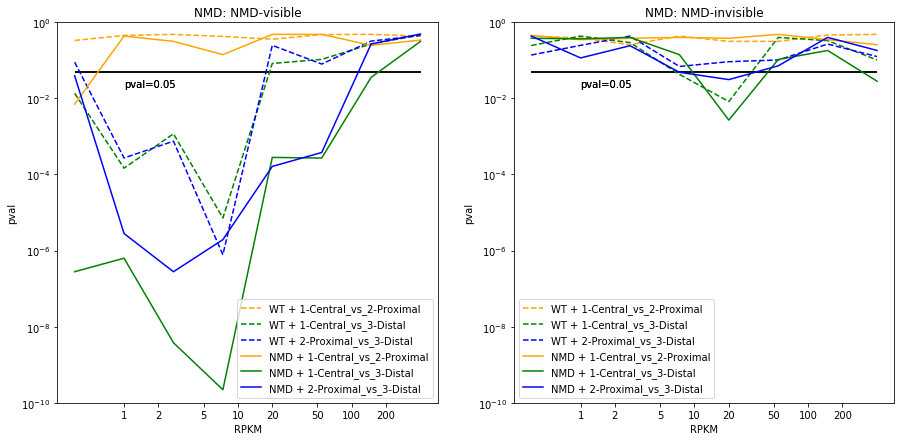

In [75]:
#plot pvalues
fig, axs = plt.subplots(1,2, figsize=(15, 7), facecolor='w', edgecolor='k')
axs = axs.ravel()
h=0
ranges=np.array([1,2,5,10,20,50,100,200])
Line_type={
    'WT':'--',
    'NMD':'-'
}
Colors={
    '2-Proximal_vs_3-Distal': 'blue',
    '1-Central_vs_2-Proximal':'orange',
    '1-Central_vs_3-Distal':'green'
}
for PTC in ['visible','invisible']:
    for Gen in ['WT','NMD']:
        for Comp in np.unique(x.Compare):
            sub=x[np.logical_and(np.logical_and(x.Compare==Comp,x.Gen==Gen),x.PTC==PTC)]
            axs[h].plot(sub.RPKM,sub.pval_adj,Line_type[Gen],label=Gen+' + '+Comp, color=Colors[Comp])

        axs[h].hlines(0.05,-1,6)
        axs[h].text(0,0.02,'pval=0.05')
        axs[h].set_yscale('log')
        axs[h].set_ylim([10**-10,1])
        axs[h].set_xticks(np.log(ranges))
        axs[h].set_xticklabels(ranges)
        axs[h].set_title(Gen+': NMD-'+PTC)
        axs[h].legend()
        axs[h].set_ylabel('pval')
        axs[h].set_xlabel('RPKM')
    h+=1
plt.savefig('Expression_Vs_retentin_pvalues.pdf',  format='pdf')

        

In [76]:
# calssified introns based on splicing efficiency 
def My_case_when(table):
    dic={

        'yesyes':'1 - Both',
        'yesno':'2 - Strong donor only',
        'noyes':'3 - Strong acceptor only',
        'nono':'4 - None',
    }
    
    return (dic[table['Strong_donor']+table['Strong_acceptor']])


In [77]:
x=all_introns.groupby(['PTC_inducing','Position','Strong_donor','Strong_acceptor']).agg({'Gene_ID':'count'}).reset_index()

x=x.assign(
AType=x.apply(lambda y: My_case_when(y),axis=1)).filter(['PTC_inducing' , 'Position','Gene_ID' ,'AType']).query('Position in ["1-Central","2-Proximal","3-Distal"]')


x=x.merge(x.groupby(['PTC_inducing' ,'Position']).agg({'Gene_ID':'sum'}).reset_index().rename(columns={'Gene_ID':'total'}),on=['PTC_inducing' ,'Position'])
Counts=x.copy()
x=x.assign(ratio=x.Gene_ID/x.total).sort_values(['PTC_inducing' ,'Position','AType'],ascending=[False,True,True])


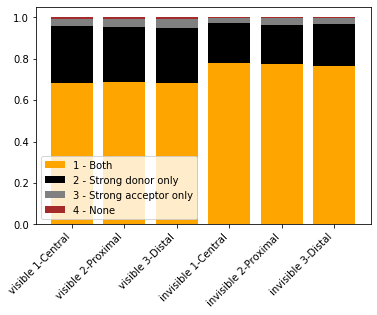

In [78]:
Cols={
       '1 - Both':'orange',
        '2 - Strong donor only':'black',
        '3 - Strong acceptor only':'grey',
        '4 - None':'brown'   
}


def sum_before(x,cycle):
    results=np.zeros(len(x.iloc[range(cycle,24,4)].ratio))
    if cycle!=0:
        for a in range(cycle):
            results+=np.array(x.iloc[range(a,24,4)].ratio)
    
    return results
for i in range(4):
    plt.bar(x=x.iloc[range(i,24,4)].PTC_inducing+' '+x.iloc[range(i,24,4)].Position,
        height=x.iloc[range(i,24,4)].ratio,label=x.iloc[range(i,24,4)].AType.values[1],bottom=sum_before(x,i),color=Cols[x.iloc[range(i,24,4)].AType.values[1]])
    
plt.legend()
plt.xticks(rotation=45,horizontalalignment='right')

plt.savefig('Strong_acceptors_dist_not_3n_non3n.pdf',  format='pdf')


In [79]:
#Differences between Central and Distal
x.query("PTC_inducing=='visible' and Position in ['1-Central','3-Distal']").pivot(index='AType', columns='Position', values='ratio')


Position,1-Central,3-Distal
AType,,
1 - Both,0.684257,0.683214
2 - Strong donor only,0.271826,0.264401
3 - Strong acceptor only,0.038162,0.044587
4 - None,0.005755,0.007799


In [80]:
# chi squared 
positions=["1-Central","2-Proximal","3-Distal"]
tests=dict()
for P1 in range(2):
    for P2 in range(P1+1,3):
        for PTC in ['visible','invisible']:
            tests[PTC+' '+positions[P1]+' vs '+positions[P2]]=chis(
                    np.array(x.query('PTC_inducing=="'+PTC+'" and Position in ["'+positions[P1]+'","'+positions[P2]+'"]').filter(['Position','Gene_ID','AType']).pivot(index='Position',columns='AType',values='Gene_ID')
))
            
for positions in ["1-Central","2-Proximal","3-Distal"]:
    tests[positions +' visible vs invisible']=chis(
            np.array(x.query('Position=="'+positions+'"').filter(['PTC_inducing','Gene_ID','AType']).pivot(index='PTC_inducing',columns='AType',values='Gene_ID')))
    


In [81]:
# adjust by fdr
adjusted_pval=fdr([tests[i][1] for i in tests.keys()])
keys=[i for i in tests.keys()]
{keys[i]:[adjusted_pval[1][i],stars(adjusted_pval[1][i])] for i in range(len(adjusted_pval[0]))}


{'visible 1-Central vs 2-Proximal': [0.3108467319483405, 'NS'],
 'invisible 1-Central vs 2-Proximal': [0.3108467319483405, 'NS'],
 'visible 1-Central vs 3-Distal': [0.013074586152376232, '*'],
 'invisible 1-Central vs 3-Distal': [0.3108467319483405, 'NS'],
 'visible 2-Proximal vs 3-Distal': [0.3108467319483405, 'NS'],
 'invisible 2-Proximal vs 3-Distal': [0.41425243651399557, 'NS'],
 '1-Central visible vs invisible': [7.074281428059787e-16, '******'],
 '2-Proximal visible vs invisible': [1.5537361851979765e-15, '******'],
 '3-Distal visible vs invisible': [1.2084279893302629e-25, '******']}

In [82]:
# Sort introns by distance from center 
all_introns=all_introns.sort_values(['distance_center'])

In [83]:
#Recoverl old transcript notation (same of the introns)
Transcripts_old_notation=pd.read_csv('/Volumes/Storage3/Paramecium.FromChunlong/Data/Annotation/mRNA_Gaze.51.gff3',names=['scaffold','source','type','start','end','score', 'strand', 'phase','attributes'],sep='\t')
Transcripts_old_notation=Transcripts_old_notation.query('type=="mRNA"').filter(['scaffold','start','end','strand','attributes'])
Transcripts_old_notation['scaffold']=Transcripts_old_notation.scaffold.str.split('_').str[1]
Transcripts_old_notation[['scaffold','start','end']]=Transcripts_old_notation[['scaffold','start','end']].astype(int)
Transcripts_old_notation=Transcripts_old_notation.query('(scaffold < 167 or scaffold==556) and start!=end')
ID_gene=re.compile('GSPATT.{11}')
Transcripts_old_notation['attributes']=Transcripts_old_notation.attributes.apply(lambda x: ID_gene.findall(x)[0] )
Transcripts_old_notation['attributes']=Transcripts_old_notation.attributes.apply(lambda x: x.replace('GSPATT','GSPATG'))
Transcripts_old_notation=Transcripts_old_notation.rename(columns={
    'start':'start_gene',
    'end':'end_gene',
    'attributes':'Gene_ID'
})
all_introns=all_introns.merge(Transcripts_old_notation).sort_values(['distance_center'])
all_introns['random_center']=all_introns[['start_gene','end_gene']].apply(lambda x: np.random.choice(list(range(x['start_gene'],x['end_gene']))), axis=1)

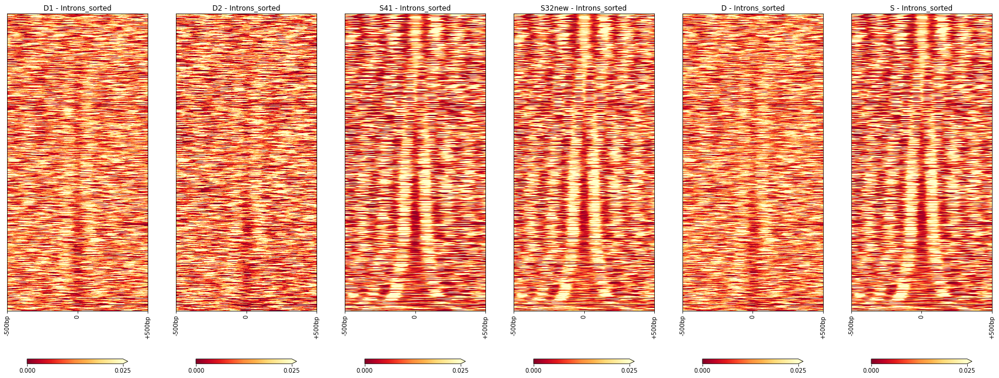

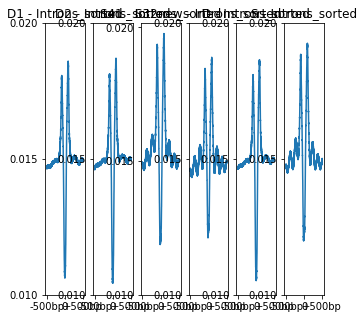

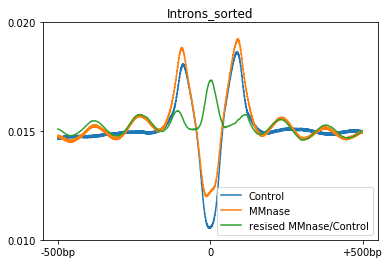

In [84]:
#calculate matrixes for plotting(introns)
introns_signals={i:matrix_to_plot(data[i],all_introns.dropna(),500) for i in data.keys()}

#calculate average profiles(introns)
introns_signals_av={i:average_profile(introns_signals[i]) for i in introns_signals.keys()}

#plot introns ordered by distance
plot_heatmaps_and_profiles(Signal=introns_signals,
                           AV=introns_signals_av,
                           what='Introns_sorted',HeatTH=0.025,HeatColor='YlOrRd_r',
                           HeatRatio=0.03,
                           minmaxAv=[0.01,0.02],baseline=0.015,breaks=[0,500,1001], label=["-500bp","0","+500bp"])



In [85]:
all_introns_rand=all_introns.dropna()
all_introns_rand=all_introns_rand[['Gene_ID','scaffold','strand','random_center','distance_center']]
all_introns_rand=all_introns_rand.assign(
start=all_introns_rand.random_center,
    end=all_introns_rand.random_center

)
scaffold_list=np.unique(Peaks.scaffold.values)
for Scaffold in scaffold_list:

    all_introns_rand[all_introns_rand.scaffold==Scaffold]=all_introns_rand[all_introns_rand.scaffold==Scaffold].assign(
        distance_center=np.asarray(np.min(abs(np.matrix(all_introns_rand.query('scaffold=='+str(Scaffold)).random_center.values)-np.matrix(Peaks.query('scaffold=='+str(Scaffold)).center.values).T),axis=0))[0],
    )
all_introns_rand=all_introns_rand.sort_values(['distance_center'])

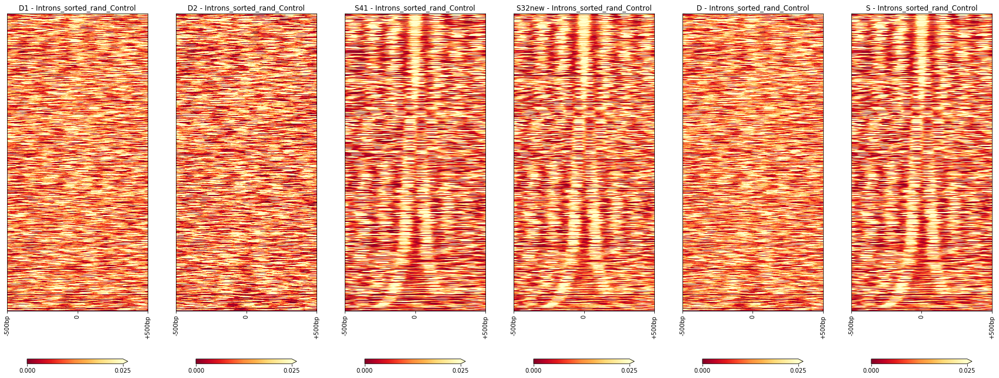

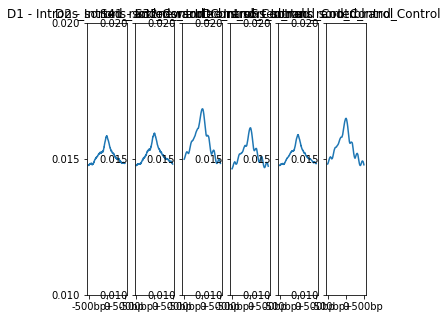

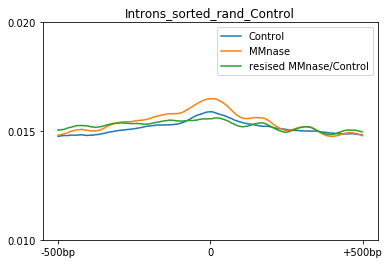

In [86]:

#calculate matrixes for plotting(introns)
introns_signals={i:matrix_to_plot(data[i],all_introns_rand,500) for i in data.keys()}

#calculate average profiles(introns)
introns_signals_av={i:average_profile(introns_signals[i]) for i in introns_signals.keys()}
#plot
plot_heatmaps_and_profiles(Signal=introns_signals,
                           AV=introns_signals_av,
                           what='Introns_sorted_rand_Control',HeatTH=0.025,HeatColor='YlOrRd_r',
                           HeatRatio=0.03,
                           minmaxAv=[0.01,0.02],baseline=0.015,breaks=[0,500,1001], label=["-500bp","0","+500bp"])


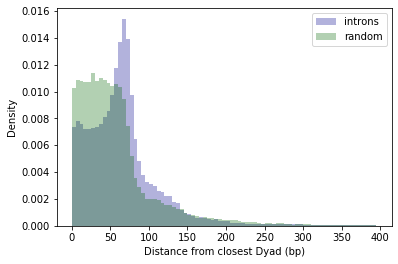

In [87]:
#plot histogram intron distance vs random

R=range(0,400,5)
plt.hist(all_introns.distance_center.dropna(), color='darkblue',label='introns', bins=R,alpha=0.3,density=True)
plt.hist(all_introns_rand.distance_center.dropna(), color='darkgreen',label='random', bins=R,alpha=0.3,density=True)

plt.legend()
plt.xlabel('Distance from closest Dyad (bp)')
plt.ylabel('Density')
plt.savefig('Hist_distance_closest_Dyad.pdf',  format='pdf')

In [88]:
# Statistical test: introns are farther from nucleosome centers than random positions
MannWhit(all_introns_rand.distance_center.dropna(),all_introns.distance_center.dropna(), alternative='less')

MannwhitneyuResult(statistic=2101531854.0, pvalue=0.0)

# Run after model fitting 

In [223]:
# write files to create logo plots
fasta_dir='/Volumes/Storage3/Paramecium.FromChunlong/Data/Genome/mac_51/Scaffold/'
sequences=dict()
fasta_files=['20120207.scaffold51_'+str(i)+'.fa' for i in list(range(1,167))]
for i in list(range(1,167))+[556]:
    f = open(fasta_dir+'20120207.scaffold51_'+str(i)+'.fa','r')
    lines=f.readlines()[1:]
    f.close()
    sequences[i]=''.join([l.strip('\n') for l in lines])
    
def logo_Introns(Introns,sequences,Side='start',bp=8,before=0,after=0,filename='None'): 

    Complement={
        'A':'T',
        'T':'A',
        'G':'C',
        'C':'G'
    }

    Info={'seq':{}}
    for i in range(len(Introns.scaffold)):
        
        if Introns.strand.iloc[i]=='-':
            a=before
            b=-1-after
            intron=sequences[Introns.scaffold.iloc[i]][(Introns.start.iloc[i]+b):(Introns.end.iloc[i]+a)]
            intron=intron.upper()
            intron=[Complement[b] for b in intron[::-1]]
            intron=''.join(intron)
        else:
            b=-1-before
            a=after
            intron=sequences[Introns.scaffold.iloc[i]][(Introns.start.iloc[i]+b):(Introns.end.iloc[i]+a)]
            intron=intron.upper()
            
            if Side== 'start':
                Info['seq'][i]=intron[:bp]
            else:
                Info['seq'][i]=intron[-bp:]

    return Info

cases={

        'yesyes':'Both',
        'yesno':'Strong_donor_only',
        'noyes':'Strong_acceptor_only',
        'nono':'None',
    }
for Start in ['start','end']:
    for donor in ['yes','no']:
        for acceptor in ['yes','no']:
            x=logo_Introns(all_introns.query("Strong_donor=='"+donor+"' and Strong_acceptor=='"+acceptor+"'"),sequences,Side=Start)
            pd.DataFrame(x).to_csv(Start+'_'+cases[donor+acceptor]+'.csv')

In [224]:
# calculate gc content introns
def GCcontent(sequences,Introns,i):
    intron=sequences[Introns.scaffold.iloc[i]][(Introns.start.iloc[i]+1):(Introns.end.iloc[i]-2)]
    GC=100*(intron.count('C')+intron.count('G'))/len(intron)
    return GC
all_introns=all_introns.assign(GC=[GCcontent(sequences,all_introns,i) for i in range(len(all_introns.index))])

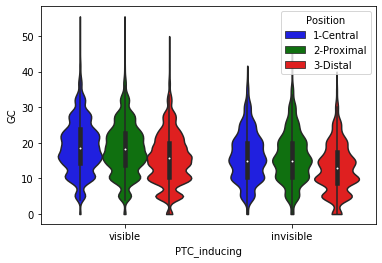

In [225]:
colors={'1-Central':'blue','3-Distal':'red','2-Proximal':'green'}

sns.violinplot(data=all_introns.query('Position != "4-Unclassified"'), x="PTC_inducing",y="GC", hue="Position",
               palette=colors,cut=0
)
plt.savefig('GC_dist_introns.pdf',  format='pdf')

In [234]:
# statistical test

positions=['1-Central','3-Distal','2-Proximal']
tests=dict()
for P1 in range(2):
    for P2 in range(P1+1,3):
        for PTC in ['visible','invisible']:
            tests[PTC+' '+positions[P1]+' vs '+positions[P2]]=MannWhit(
                all_introns.query('Position=="'+positions[P1]+'" and PTC_inducing=="'+PTC+'"').GC.values,
    all_introns.query('Position=="'+positions[P2]+'" and PTC_inducing=="'+PTC+'"').GC.values)

for positions in ['1-Central','3-Distal','2-Proximal']:
    tests[positions+' Visible vs Invisible']=MannWhit(
                all_introns.query('Position=="'+str(positions)+'" and PTC_inducing=="visible"').GC.values,
    all_introns.query('Position=="'+str(positions)+'" and PTC_inducing=="invisible"').GC.values) 

In [235]:
#adjust pval with fdr
adjusted_pval=fdr([tests[i][1] for i in tests.keys()])
keys=[i for i in tests.keys()]
{keys[i]:[adjusted_pval[1][i],stars(adjusted_pval[1][i])] for i in range(len(adjusted_pval[0])) }


{'visible 1-Central vs 3-Distal': [0.0, '******'],
 'invisible 1-Central vs 3-Distal': [2.39100222016511e-70, '******'],
 'visible 1-Central vs 2-Proximal': [2.0051196260583943e-10, '******'],
 'invisible 1-Central vs 2-Proximal': [0.1163837954410093, 'NS'],
 'visible 3-Distal vs 2-Proximal': [3.004271048044346e-219, '******'],
 'invisible 3-Distal vs 2-Proximal': [4.5679576989842393e-64, '******'],
 '1-Central Visible vs Invisible': [5.809560441894263e-57, '******'],
 '3-Distal Visible vs Invisible': [7.443752646176373e-106, '******'],
 '2-Proximal Visible vs Invisible': [1.3138852601802994e-47, '******']}

In [237]:
#prepare for plotting
bin_size=10
RetGC=all_introns.assign(

    GCp=all_introns.GC.apply(lambda x:  bin_size*np.round(x/bin_size))

).query('Position in ["1-Central","3-Distal","2-Proximal"]').groupby(['PTC_inducing','GCp','Position']).agg({'Ret_eff_WT':['mean','sem','count'],
                                                 'Ret_eff_NMD':['mean','sem','count']}).reset_index()

RetGC=RetGC[RetGC['GCp'] >= 0]
RetGC=RetGC[RetGC['GCp'] <= 40]

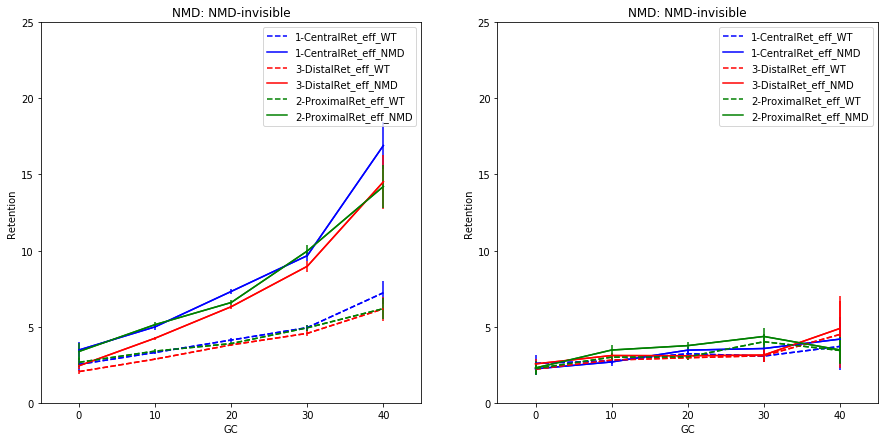

In [240]:
#plot retention vs gc
fig, axs = plt.subplots(1,2, figsize=(15, 7), facecolor='w', edgecolor='k')
axs = axs.ravel()
h=0
Position=["1-Central","3-Distal","2-Proximal"]
Line=['Ret_eff_WT','Ret_eff_NMD']
Line_type={
    'Ret_eff_WT':'--',
    'Ret_eff_NMD':'-'
}
NMD="visible"
COL={
    "3-Distal":'red',
    "1-Central":'blue',
    '2-Proximal':'green'
}
for NMD in ["visible","invisible"]:
    for p in Position:
        for l in Line:
            sub=RetGC[np.logical_and(RetGC.Position==p , RetGC.PTC_inducing==NMD )]
            axs[h].plot(sub.GCp,sub[l]['mean'],Line_type[l],color=COL[p],label=p+l)
            axs[h].errorbar(sub.GCp.values,sub[l]['mean'].values,sub[l]['sem'].values,
                          linestyle=Line_type[l],
                          color=COL[p])
        axs[h].set_ylim([0,25])
        axs[h].set_xlim([-5,45])
        axs[h].set_title(Gen+': NMD-'+PTC)
        axs[h].legend()
        axs[h].set_ylabel('Retention')
        axs[h].set_xlabel('GC')
    h+=1

plt.savefig('Spl_eff_GC_dist_introns.pdf',  format='pdf')

In [241]:
# prepare to calculate pvalues
x=all_introns.assign(

    GCp=all_introns.GC.apply(lambda x:  bin_size*round(x/bin_size))

).query('Position in ["1-Central","3-Distal","2-Proximal"]').rename(columns={'Ret_eff_WT':'WT','Ret_eff_NMD':'NMD'})

x=x[x['GCp'] >= 0]
x=x[x['GCp'] <= 40]

In [242]:
# calculate pvalues
Stat=dict()
h=0
position=["1-Central","3-Distal","2-Proximal"]
for PTC in ['visible','invisible']:
    for Gen in ['WT','NMD']:
        for GC in np.unique(x.GCp):
            for P1 in range(2):
                for P2 in range(P1+1,3):
                    h+=1
                    Stat[h]={
                        'Compare':position[P1]+'_vs_'+position[P2],
                        'GC':GC,
                        'PTC':PTC,
                        'Gen':Gen,
                        'pval':MannWhit(x[np.logical_and(np.logical_and(x['PTC_inducing']==PTC, x['Position']==position[P1]),x['GCp']==GC)][Gen].values,
x[np.logical_and(np.logical_and(x['PTC_inducing']==PTC, x['Position']==position[P2]),x['GCp']==GC)][Gen].values)[1]}

In [243]:
# adjust with fdr
x=pd.DataFrame(Stat).transpose()
x=x.assign(
pval_adj=fdr(x.pval)[1])

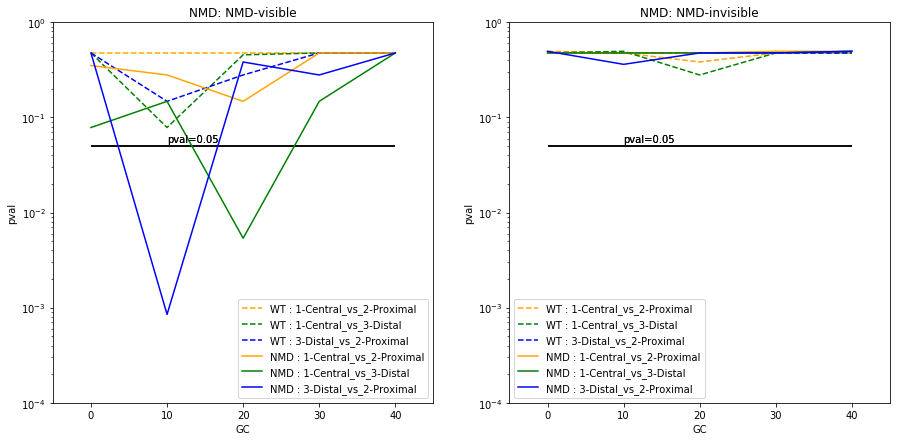

In [246]:
# plot pvalues 
fig, axs = plt.subplots(1,2, figsize=(15, 7), facecolor='w', edgecolor='k')
axs = axs.ravel()
h=0
ranges=np.array([1,2,5,10,20,50,100,200])
Line_type={
    'WT':'--',
    'NMD':'-'
}
Colors={
    '3-Distal_vs_2-Proximal': 'blue',
    '1-Central_vs_2-Proximal':'orange',
    '1-Central_vs_3-Distal':'green'
}

for PTC in ['visible','invisible']:
    for Gen in ['WT','NMD']:
        for Comp in np.unique(x.Compare):
            sub=x[np.logical_and(np.logical_and(x.Compare==Comp,x.Gen==Gen),x.PTC==PTC)]
            axs[h].plot(sub.GC,sub.pval_adj,Line_type[Gen],label=Gen+' : '+Comp,color=Colors[Comp])
        axs[h].hlines(0.05,0,40)
        axs[h].text(10,0.055,'pval=0.05')
        axs[h].set_yscale('log')
        axs[h].set_ylim([10**-4,1])
        axs[h].set_xlim([-5,45])
        axs[h].set_title(Gen+': NMD-'+PTC)
        axs[h].legend()
        axs[h].set_ylabel('pval')
        axs[h].set_xlabel('GC')
    h+=1
plt.savefig('GC_Vs_Splice_eff_pvalues.pdf',  format='pdf')



        

In [249]:
# split nucleosomes ( within of outside genes)
Peaks_new={'WithinGenes':pd.DataFrame(),'OutsideGenes':pd.DataFrame()}
for Scaffold in list(range(1,167))+[556]:
    x=np.matrix(Transcripts.query('scaffold==@Scaffold ')['start'])-np.matrix(Peaks.query('scaffold==@Scaffold').center).T
    y=np.matrix(Transcripts.query('scaffold==@Scaffold')['end'])-np.matrix(Peaks.query('scaffold==@Scaffold').center).T 
    x[x==0]=1
    y[y==0]=-1
    Peaks_new['WithinGenes']=Peaks_new['WithinGenes'].append(Peaks.query('scaffold==@Scaffold')[(np.sign(x/y)==-1).sum(axis=1)!=0])
    
    Peaks_new['OutsideGenes']=Peaks_new['OutsideGenes'].append(Peaks.query('scaffold==@Scaffold')[(np.sign(x/y)==-1).sum(axis=1)==0])
    

In [250]:
# calculate distances
distance={'WithinGenes':[],'OutsideGenes':[]}
for Peak in ['WithinGenes','OutsideGenes']:
    for Scaffold in np.unique(Peaks_new[Peak].scaffold):
        x=np.matrix(Peaks_new[Peak].query('scaffold==@Scaffold').center)
        z=np.abs(x-x.T)
        if len(z)!=0:
                distance[Peak].append(np.triu(z,1).flatten())
    
    distance[Peak]=np.concatenate(distance[Peak]).flatten()

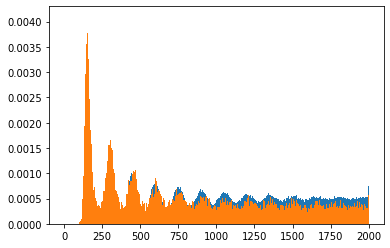

In [130]:
#calculate distribution
Max=2000
p={sample:plt.hist(distance[sample],bins=range(1,Max),density=True) for sample in distance.keys()}

In [131]:
# smooth distributions and id local maxima

def smooth_and_maxima(p,sigma=10):
    #Gaussian convolution
    x=np.array(range(-int((sigma*3)),int((1+sigma*3))))
    gauss_array=(1/np.sqrt(2*np.pi*sigma**2))*np.exp(-(x**2/(2*sigma**2)))
    Smooth=np.convolve(p[0],gauss_array,mode='same') 
    # deriv
    x=np.array(range(-int(sigma*3),int(1+sigma*3)))
    gauss_array=(-x/(sigma**3 *np.sqrt(2*np.pi)))*np.exp(-(x**2/(2*sigma**2)))
    der=np.convolve(p[0],gauss_array,mode='same') 
    #maxima
    maxima=np.where(np.logical_and(der[1:] < 0 , der[:-1] > 0))[0]
    maxima=maxima[:-1]
    return {'Data':p[0],'Smooth':Smooth,'Maxima':maxima}

p={sample:smooth_and_maxima(p[sample]) for sample in p.keys()}

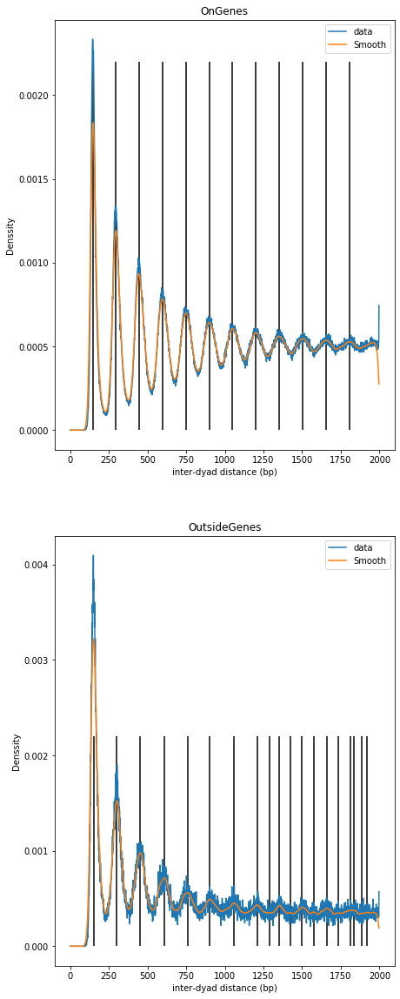

In [132]:
#compare fit and real data
Samples=[*p.keys()]
fig, axs = plt.subplots(2, figsize=(7, 20), facecolor='w', edgecolor='k')
axs = axs.ravel()
for h in range(2):
    axs[h].plot(p[Samples[h]]['Data'], label='data')
    axs[h].plot(p[Samples[h]]['Smooth'], label='Smooth')
    axs[h].vlines(p[Samples[h]]['Maxima'],0,0.0022)
    axs[h].set_title(Samples[h])
    axs[h].legend()
    axs[h].set_xlabel('inter-dyad distance (bp)')
    axs[h].set_ylabel('Denssity')

plt.savefig('NRL_genes_no_genes.pdf',  format='pdf')


In [133]:
# using the first n peaks calculate liner regression between distance and peak position (NRL)

def Calc_NRL(maxima,how_many=7):
    x=np.array(range(1,how_many+1))
    y=np.array(maxima[:how_many])
    slope, intercept, r_value, p_value, std_err = stats.linregress(x,y)
    result='{}±{}'.format(np.round(slope,2),np.round(np.sqrt(len(x))*std_err,2))
    if(np.sign(intercept)==-1):
        sign='-'
    else:
        sign='+'
    
    funtion='y={}x{}{}'.format(np.round(slope,2),sign,abs(np.round(intercept,2)))
    return {'Maxima':y,
            'Slope':slope,
            'Intercept':intercept,
            'R2':r_value**2,
            'p_value':p_value,
            'std_err':std_err,
            'Result':result,
            'Function':funtion}
    
fit={sample:Calc_NRL(p[sample]['Maxima'],how_many=8) for sample in p.keys()}

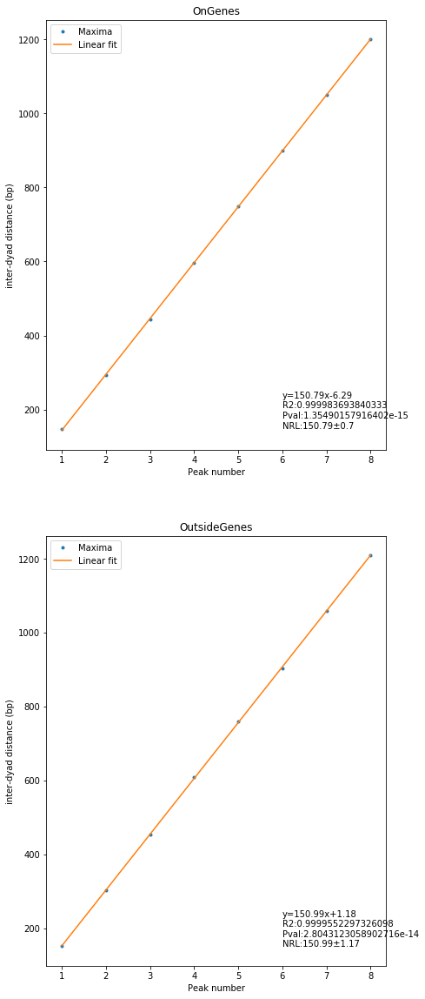

In [134]:
#plot data and fitting info
Samples=[*p.keys()]
fig, axs = plt.subplots(2, figsize=(7, 20), facecolor='w', edgecolor='k')
axs = axs.ravel()
for h in range(2):
    x=range(1,len(fit[Samples[h]]['Maxima'])+1)
    fit_data=fit[Samples[h]]['Slope']*x+fit[Samples[h]]['Intercept']
    
    
    axs[h].plot(x,fit[Samples[h]]['Maxima'],'.', label='Maxima')
    axs[h].plot(x,fit_data, label='Linear fit')
    axs[h].text(6,150,fit[Samples[h]]['Function']+'\nR2:'+str(fit[Samples[h]]['R2'])+'\nPval:'+str(fit[Samples[h]]['p_value'])+'\nNRL:'+fit[Samples[h]]['Result'])
    axs[h].set_title(Samples[h])
    axs[h].legend()
    axs[h].set_xlabel('Peak number')
    axs[h].set_ylabel('inter-dyad distance (bp)')

    
plt.savefig('NRL_fit_gene_no_gene.pdf',  format='pdf')


In [293]:
Peaks=pd.read_csv("/Users/sgnan/Desktop/paramecium/common_Nucleosome_peaks.bed",sep='\t',names=['scaffold','start','end'])
Peaks1=pd.read_csv("/Users/sgnan/Desktop/paramecium/s32new_Nucleosome_peaks.bed",sep='\t',names=['scaffold','start','end'])
Peaks2=pd.read_csv("/Users/sgnan/Desktop/paramecium/s41_Nucleosome_peaks.bed",sep='\t',names=['scaffold','start','end'])


In [294]:
# percentage of shared peaks
100*Peaks.shape[0]/(Peaks1.shape[0]+Peaks2.shape[0]-Peaks.shape[0])

79.99572696286432

In [295]:
# percentage of bp of the genome belonging to a gene

scaffold=pd.read_csv('/Volumes/Storage3/Paramecium.FromChunlong/Data/Genome/mac_51/20111128.Scaffold.tab',sep='\t')
scaffold['Scaffold']=scaffold.Scaffold.apply(lambda x: x.split('_')[1]).astype('int')
sequence_lengh=sum(scaffold.query('Scaffold < 167 or Scaffold==556').Length)
100*np.sum(Transcripts.end-Transcripts.start)/sequence_lengh

82.38481480952869